---
# **Unveiling Connections: Network Analysis of the S&P 500 Stocks**

Active investing in the asset management industry aims to beat the stock market´s average returns. Portfolio managers track a particular index and try to beat that index by creating their own portfolios.


The construction of a portfolio involves the selection of stocks that have higher probability of giving better returns in comparison to the tracking index. In this case, the S&P500. In this project, using network analysis a simulation of portfolio value is made, keeping the portfolio for an entire year and then a comparisson against the S&P500 is made.


In [2]:
# Importing the necessary libraries
import pandas as pd 
import numpy as np
import seaborn as sns
import networkx as nx
import matplotlib.pyplot as plt

In [3]:
# Loading the data from the csv file in the github repository
df1 = pd.read_csv('https://raw.githubusercontent.com/andresfelipe0711/Network-Stock-Portfolio-Optimization/refs/heads/main/snp500_price_data_2011_to_2020.csv', index_col = 0)
df2 = pd.read_csv('https://raw.githubusercontent.com/andresfelipe0711/Network-Stock-Portfolio-Optimization/refs/heads/main/snp500_price_data_2021.csv', index_col = 0)
display(df1.head())

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS,CEG,OGN
Date,,,,,,,,,,,,,,,,,,,,,
2010-12-31,63.855606,8.113162,17.986767,NaN,9.61,39.143620,11.245819,22.385578,30.780001,31.271172,...,16.221039,23.216919,NaN,28.547478,37.990002,49.212429,21.089169,NaN,NaN,NaN
2011-01-03,64.218163,8.125947,17.952976,NaN,9.80,39.224346,11.318138,22.623722,31.290001,31.791464,...,16.227924,23.569420,NaN,28.570745,38.200001,50.395058,21.907326,NaN,NaN,NaN
2011-01-04,64.129395,8.100383,18.121916,NaN,9.80,38.966022,11.327178,22.608845,31.510000,31.676586,...,16.296804,23.665552,NaN,28.134232,37.840000,49.725819,21.550467,NaN,NaN,NaN
2011-01-05,64.129395,8.285738,18.121916,NaN,10.03,38.974094,11.110217,22.713020,32.220001,32.183357,...,16.200367,23.745670,NaN,28.268110,37.799999,49.762482,21.672325,NaN,NaN,NaN
2011-01-06,63.737186,8.289999,18.084377,NaN,10.05,39.119389,11.083097,23.583750,32.270000,32.433369,...,16.186602,24.146229,NaN,28.465996,37.480000,48.222305,21.611391,NaN,NaN,NaN


In [4]:
display(df2.head())

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,WYNN,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS,CEG
Date,,,,,,,,,,,,,,,,,,,,,
2020-12-31,169.412521,53.700413,107.444366,101.195663,324.200012,257.353546,92.402596,49.218819,500.119995,172.915405,...,112.830002,64.846153,141.770004,100.827858,106.770256,384.329987,153.096832,42.901466,164.329178,NaN
2021-01-04,166.582382,52.818787,107.071472,99.552361,316.730011,252.673630,89.466812,48.691574,485.339996,165.810379,...,106.900002,63.863796,142.429993,98.747719,104.075439,378.130005,152.172821,42.397789,162.432663,NaN
2021-01-05,166.301315,53.161644,108.396248,100.581787,322.600006,254.112091,90.253006,49.638653,485.690002,165.349136,...,110.190002,63.241299,144.229996,98.628838,104.085266,380.570007,154.805740,43.069359,163.564590,NaN
2021-01-06,168.831009,54.993446,108.170555,99.712914,321.609985,256.890442,87.575966,51.649975,466.309998,164.770126,...,110.849998,64.641907,141.220001,102.789139,104.655716,394.820007,159.217133,47.908611,165.967484,NaN
2021-01-07,164.498520,55.669361,109.220566,100.780106,323.559998,259.314148,89.237915,51.191086,477.739990,165.702438,...,109.750000,63.377476,149.710007,107.454628,103.859055,409.100006,158.273254,49.370266,165.818558,NaN


# **Exploratory Analysis**
The proposed approach for the project is the following:
- Collect the data from the S&P500 from 2011 till 2020
- Compute log returns for the S&P500 components for the same period
- Compute the correlation matrix for the above log returns
- Find out the **top n Central and peripheral stocks** based on the network topological parameters below:
    - Degree centrality
    - Betweenness centrality
    - Distance on degree criterion
    - Distance on correlation criterion
    - Distance on distance criterion

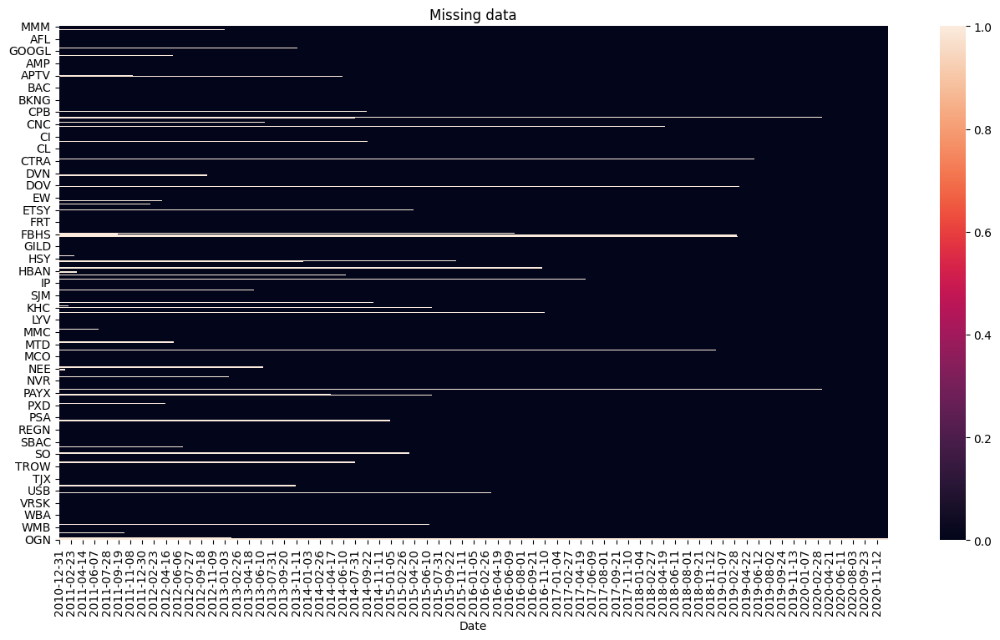

In [5]:
# Missing data due to index rebalancing
plt.figure(figsize = (16,8))
sns.heatmap(df1.T.isnull())
plt.title('Missing data')
plt.show()

Many stocks contain missing values due to **index rebalancing**—the process by which the components of the S&P 500 are updated over time. When a stock is removed from the index, its subsequent prices are recorded as null values in the dataset.

For this particular analysis we need to work with clean data. The missing values are not missing at random, they are null because the stock is removed from the index. Imputing values would be incorrect because it means we are creating synthetic prices for the stocks that never existed within the index, also, in network analysis that´d mean we are creating fake paths and relationships between nodes. For that reason the missing values are dropped.

In [6]:
df1 = df1.dropna(axis = 1) # Dropping column wise

## **Splitting the data yearwise**
To better understand the behaviour in the data, the stock prices are divided by year

In [7]:
def divide_year(data, year):
    yearwise_data = data[data.index.str.startswith(str(year))]
    return yearwise_data

In [8]:
sp500_years = {}
for year in range(2011, 2021):
    sp500_years[year] = divide_year(df1, year)

# Example: access data for 2011 with sp500_years[2011]

In [9]:
# Visualizing the datasets
for i in range (2011, 2021):
    display(sp500_years[i].head())

,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-03,64.218163,8.125947,17.952976,9.80,39.224346,11.318138,22.623722,31.290001,31.791464,62.732765,...,67.926483,11.205445,93.139076,77.632828,16.227924,23.569420,28.570745,38.200001,50.395058,21.907326
2011-01-04,64.129395,8.100383,18.121916,9.80,38.966022,11.327178,22.608845,31.510000,31.676586,59.610516,...,66.950417,11.123855,91.576157,80.054619,16.296804,23.665552,28.134232,37.840000,49.725819,21.550467
2011-01-05,64.129395,8.285738,18.121916,10.03,38.974094,11.110217,22.713020,32.220001,32.183357,59.687115,...,67.400887,11.141987,92.847679,81.087433,16.200367,23.745670,28.268110,37.799999,49.762482,21.672325
2011-01-06,63.737186,8.289999,18.084377,10.05,39.119389,11.083097,23.583750,32.270000,32.433369,57.723724,...,65.966843,11.119320,93.112579,81.678650,16.186602,24.146229,28.465996,37.480000,48.222305,21.611391
2011-01-07,63.803787,8.409311,18.159452,9.89,39.183979,10.938456,23.777237,32.040001,32.507687,59.265705,...,65.689018,11.296103,92.953644,84.570557,16.331245,24.010040,28.821018,37.599998,48.213131,21.385098


,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2012-01-03,63.380398,8.921551,22.094471,18.250000,43.607441,11.196037,21.955198,28.570000,37.882984,66.431717,...,37.509338,15.315088,102.781456,85.516472,19.624754,26.573278,34.782341,35.720001,49.450771,14.626753
2012-01-04,63.904217,9.064224,22.008770,18.110001,43.590965,11.113444,22.319967,28.280001,37.841248,67.989166,...,37.865036,15.406450,102.198677,84.045799,19.495548,26.294764,35.019890,35.450001,48.781536,14.949463
2012-01-05,63.615753,9.081518,21.958132,18.270000,42.759171,11.113444,22.221178,28.480000,38.119488,68.421799,...,38.908890,15.731939,103.973511,83.167892,19.581686,26.524134,35.287128,35.400002,49.359116,15.368120
2012-01-06,63.289337,9.023156,21.759470,18.139999,42.685055,11.232746,22.091982,28.719999,38.175137,68.739052,...,38.259373,15.640575,103.099335,80.241562,19.524267,26.352112,35.542488,35.110001,49.487453,15.385561
2012-01-09,63.668880,9.072872,21.755571,18.209999,42.610928,11.196037,21.970392,28.530001,38.029064,68.719818,...,39.040348,15.863282,102.225166,80.016434,19.538618,26.925508,35.405914,34.950001,49.854164,15.594892


,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-02,73.889801,14.172298,26.871367,13.69,58.158623,10.193954,22.333019,38.340000,41.823231,69.918213,...,85.115784,20.203440,90.754967,96.279907,20.435583,31.153555,40.630287,40.959999,62.755383,19.219213
2013-01-03,73.804047,13.950754,27.894245,13.45,57.948078,10.249813,22.153858,37.750000,41.987953,69.918213,...,84.901329,20.049082,91.682121,97.315514,20.375874,31.094772,40.884377,41.000000,63.654533,19.245436
2013-01-04,74.349770,14.102108,27.726561,13.41,58.268093,10.398766,22.761450,38.130001,42.360413,71.008133,...,84.178574,20.268751,91.655632,98.489746,20.450508,30.657999,41.332077,40.669998,63.978951,19.796055
2013-01-07,74.443306,13.946370,27.952940,13.25,58.015461,10.408074,21.818899,37.939999,42.195675,70.767006,...,82.891983,20.179695,91.390732,98.824112,20.234066,30.531998,41.071922,40.900002,64.136543,19.699917
2013-01-08,74.451103,14.211782,27.961315,13.21,58.352329,10.231193,22.075962,38.139999,42.439209,69.609566,...,83.400261,19.930346,90.940399,98.742554,20.271379,29.910440,39.347736,40.930000,64.229271,19.306614


,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2014-01-02,110.108368,23.659372,32.576065,26.850000,69.972672,17.043392,34.216030,59.290001,58.674488,106.140381,...,126.255348,23.685078,117.033112,169.137558,21.353500,39.525215,46.343967,53.180000,86.544601,26.035259
2014-01-03,110.363457,23.654932,32.925430,27.059999,70.205551,17.250896,34.375202,59.160000,59.313675,109.177391,...,126.959351,23.530401,115.973511,167.479828,21.345741,39.224277,46.634045,53.580002,86.919937,26.219656
2014-01-06,109.709778,23.637188,33.359997,27.299999,69.463837,17.052826,34.446835,58.119999,58.637760,108.132828,...,124.976868,23.759338,116.000000,167.360214,21.229309,39.052319,46.597019,53.400002,87.482864,26.035259
2014-01-07,109.725761,23.406448,33.104366,27.620001,70.309052,17.279188,34.104591,58.970001,59.350426,109.467567,...,125.082024,24.136757,116.344368,172.188095,21.594122,39.138302,47.251228,53.950001,89.228027,26.114286
2014-01-08,108.912651,23.140215,33.402603,28.230000,70.852432,17.298054,33.714619,58.900002,59.034492,108.616432,...,127.525742,24.229576,116.529800,175.418030,21.508741,39.473610,47.232708,53.910000,91.414162,26.342588


,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-02,133.949738,25.163288,39.116314,37.310001,78.595978,19.168922,42.271088,72.339996,71.376930,153.631775,...,159.112366,29.139334,118.013245,129.636993,29.111950,38.451271,45.577534,77.430000,106.547775,24.978090
2015-01-05,130.928818,24.723015,39.125034,37.070000,77.268959,18.902290,40.808426,71.980003,71.325500,151.606766,...,155.831345,27.985874,117.165565,127.430626,28.781498,37.745739,44.651497,76.339996,110.522377,24.042185
2015-01-06,129.532654,24.520847,38.680729,36.130001,76.711601,18.549953,40.003956,70.529999,70.734200,151.500183,...,154.545303,27.605688,116.582779,124.712387,28.934629,37.198963,44.103436,75.790001,109.585533,23.123941
2015-01-07,130.471588,24.700550,38.994350,37.279999,78.321747,18.150005,40.605286,71.110001,71.351219,154.755707,...,158.180817,27.457479,118.251656,128.374954,29.184496,37.216599,45.564934,77.720001,112.310951,23.344675
2015-01-08,133.598679,25.342997,39.795845,38.959999,79.516075,18.330936,40.012093,72.919998,72.988022,156.112228,...,162.261505,27.721682,119.602646,129.919434,29.522999,38.045589,46.358692,79.379997,113.503342,23.671360


,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2016-01-04,123.029991,34.158924,38.193436,85.239998,92.029945,36.190571,29.850523,91.970001,72.048828,147.732300,...,124.486076,17.994541,124.980133,62.285847,29.887930,41.560146,46.500046,66.489998,97.148750,23.762840
2016-01-05,123.566299,33.968102,38.184547,85.000000,92.508934,35.728809,30.183670,92.339996,72.224419,146.723053,...,121.804497,18.056257,125.839996,63.463291,30.189337,42.177193,46.384136,64.820000,99.171684,23.504839
2016-01-06,121.077507,33.295635,37.864262,85.300003,92.328186,35.392113,29.450733,91.019997,71.337738,142.841507,...,118.694229,15.704074,125.839996,60.175549,30.507469,41.405876,46.055717,62.230000,99.601089,22.819798
2016-01-07,118.127907,31.669020,36.956806,81.919998,89.616898,34.891872,28.751118,89.110001,69.160576,144.423233,...,115.710075,14.133667,114.949997,54.514839,30.624678,39.772518,44.484467,59.410000,97.310959,22.134762
2016-01-08,117.725655,30.542206,36.182785,84.580002,88.749298,34.353142,28.642838,87.849998,68.589935,141.250092,...,113.953224,13.927936,116.620003,52.295837,30.289793,38.955830,43.879147,59.250000,96.900650,21.885654


,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2017-01-03,153.196808,43.674160,35.615993,112.360001,107.379402,35.534645,39.687389,103.480003,93.088676,165.801254,...,157.409561,23.357042,123.239998,81.032715,35.146534,55.070808,57.956955,86.250000,99.449104,38.806141
2017-01-04,153.429138,44.060326,35.898724,115.739998,107.637573,36.232925,39.618660,104.139999,93.232590,167.161850,...,159.552155,23.282797,124.760002,83.645454,35.302288,54.669926,58.167839,87.029999,100.363434,39.363338
2017-01-05,152.904282,43.858059,36.208832,114.809998,106.024017,36.795425,39.326530,105.910004,92.674934,167.045242,...,160.034027,23.564926,125.959999,84.720215,35.302288,54.007980,58.360390,84.750000,101.008255,38.725262
2017-01-06,153.351715,43.876438,37.193855,115.419998,107.231873,36.766335,38.424343,108.300003,92.737892,164.858551,...,160.137283,24.069782,126.779999,85.637466,35.406109,55.052166,59.066399,85.959999,101.017899,38.976894
2017-01-09,152.525726,43.582214,37.157379,117.110001,106.033257,36.562668,38.450111,108.570000,92.162292,164.761353,...,156.273712,23.705986,126.010002,85.933952,34.869659,55.061493,59.231438,85.970001,102.981270,38.554516


,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2018-01-02,207.509613,57.169456,54.864082,192.490005,144.704483,62.751751,35.515671,177.699997,106.628799,103.325134,...,148.193420,24.089083,146.990005,154.734436,42.664856,64.657593,76.112846,103.709999,120.352028,46.021923
2018-01-03,207.500778,57.513241,54.985397,195.820007,145.372314,63.727516,35.241035,181.039993,107.787117,104.260109,...,148.943253,24.754358,149.740005,153.058060,42.379284,65.953041,76.047546,105.769997,121.186333,45.967468
2018-01-04,210.213120,57.782688,54.892067,199.250000,147.093674,63.093277,35.834591,183.220001,108.816727,108.107170,...,148.925629,25.179821,151.259995,153.886841,42.049103,67.143723,76.821739,107.860001,121.011703,46.158089
2018-01-05,211.851074,58.525993,55.050724,202.320007,148.307053,64.761848,35.595390,185.339996,108.752380,109.256432,...,148.625656,25.110197,152.229996,154.913406,41.754616,70.629974,77.269447,109.540001,122.214668,46.176235
2018-01-08,211.164154,58.804726,54.892067,207.800003,149.492233,65.015541,35.515671,185.039993,108.421425,108.487000,...,149.128494,25.203032,151.410004,152.850891,42.066952,71.096703,77.400040,110.629997,122.447472,45.949306


,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2019-01-02,172.615326,40.952244,66.047546,309.959991,134.627579,46.127037,37.361851,224.570007,122.168976,154.064560,...,98.403160,18.256193,149.679993,100.250534,44.487854,84.360565,86.785378,156.240005,100.080055,38.495026
2019-01-03,166.115723,39.963055,62.930489,302.290009,130.031128,44.489101,37.197617,215.699997,118.479675,158.874191,...,98.074890,18.410908,146.539993,99.280678,44.312550,81.184296,84.602448,146.880005,98.269852,38.282089
2019-01-04,172.949844,41.564590,64.726593,313.440002,135.087234,46.264347,38.055252,226.190002,123.201599,154.932800,...,102.871033,19.176332,150.500000,103.284927,44.746178,84.943359,86.804344,152.970001,101.626083,39.457855
2019-01-07,172.552078,42.308830,65.695908,314.799988,135.556427,47.568817,38.246849,229.259995,122.535065,157.205933,...,105.870918,19.664902,151.610001,105.119011,44.552441,87.187141,86.709450,155.289993,101.665199,39.615250
2019-01-08,173.275253,43.345123,64.907158,318.420013,138.984604,49.010593,38.958511,232.679993,123.257919,156.113281,...,108.250778,20.251184,152.580002,108.412697,45.069088,85.526176,86.538612,156.330002,99.385323,39.976315


,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,168.199310,45.842129,84.001167,168.809998,203.776123,57.986031,43.546406,334.429993,163.176056,155.755661,...,140.054016,20.301996,204.279999,142.405029,59.119480,100.115349,98.588562,259.140015,147.066025,49.903751
2020-01-03,166.750916,45.439079,82.977104,166.820007,203.436722,58.005798,43.461414,331.809998,162.831177,155.765411,...,137.667114,20.388422,204.330002,140.292755,59.403793,97.810677,98.279778,256.049988,146.681595,49.199547
2020-01-06,166.909790,45.726974,83.411858,179.039993,202.108246,59.063690,43.121429,333.709991,163.051529,153.205475,...,138.959595,20.656349,204.580002,140.015091,59.318501,95.771927,98.221886,258.010010,145.833878,48.600010
2020-01-07,166.236954,45.419888,82.948135,180.350006,197.744751,59.656895,42.602009,333.390015,161.077927,151.388107,...,139.006805,20.656349,204.160004,140.679504,59.195297,97.958405,98.395576,256.470001,145.705765,48.305000
2020-01-08,168.788010,45.352711,83.286247,178.690002,198.132629,59.202103,42.129803,337.869995,162.591644,149.648941,...,140.950272,20.336569,204.389999,141.562103,59.138432,97.682640,98.569267,247.639999,147.450424,48.780827


## **Computing the daily log returns**

To calculate daily returns, we shift the data so that each observation refers to the price from the previous day. This means that for a given date, the entry point is the closing price of the previous trading day.

In [10]:
# Display a shift in the data as an example
sp500_years[2012].shift(1).head()

,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2012-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-04,63.380398,8.921551,22.094471,18.250000,43.607441,11.196037,21.955198,28.570000,37.882984,66.431717,...,37.509338,15.315088,102.781456,85.516472,19.624754,26.573278,34.782341,35.720001,49.450771,14.626753
2012-01-05,63.904217,9.064224,22.008770,18.110001,43.590965,11.113444,22.319967,28.280001,37.841248,67.989166,...,37.865036,15.406450,102.198677,84.045799,19.495548,26.294764,35.019890,35.450001,48.781536,14.949463
2012-01-06,63.615753,9.081518,21.958132,18.270000,42.759171,11.113444,22.221178,28.480000,38.119488,68.421799,...,38.908890,15.731939,103.973511,83.167892,19.581686,26.524134,35.287128,35.400002,49.359116,15.368120
2012-01-09,63.289337,9.023156,21.759470,18.139999,42.685055,11.232746,22.091982,28.719999,38.175137,68.739052,...,38.259373,15.640575,103.099335,80.241562,19.524267,26.352112,35.542488,35.110001,49.487453,15.385561


When we talk about "simple stock returns," we refer to the daily percentage change in a stock's price: (Today's Price - Yesterday's Price) / Yesterday's Price. On the other hand, **log returns** are calculated as the natural logarithm of the ratio of today's price to yesterday's price: ln(Today's Price / Yesterday's Price).
# #
Statistically, stock prices are assumed to follow a **Log-Normal Distribution**. This means that when we take the logarithm of price, those transformed values tend to be normally distributed (unlike the original prices or simple returns). Log returns, in particular, are often closer to being normally distributed. This property is important because many statistical methods and financial models—such as those for calculating risk and making forecasts—rely on normality, making log returns much more convenient for analysis.

In time series analysis of financial data (like stock returns), it is essential for the series to be **stationary**, meaning, its statistical properties (mean, variance, autocorrelation) remain constant over time. Simple returns often do not exhibit stationarity due to trends and changing volatility in prices. Log returns, however, help "stabilize" the variance and remove exponential trends in price movements, making the series closer to being stationary.

For all these reasons, when performing statistical and econometric analysis of stock returns, it is preferable to use log returns. Using log returns allows for the application of statistical inference methods built on the assumption of normality and stationarity, resulting in better models and more robust forecasts for future stock behavior.

In [11]:
# Calculating daily log returns by subtracting between two days
log_returns = {}
for i in range(2011, 2021):
    log_returns[i] = np.log(sp500_years[i].shift(1) - np.log(sp500_years[i]))

In [12]:
# Display one year of log returns
log_returns[2011].head()

,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-04,4.095298,1.797416,2.711767,2.017249,3.571268,2.185032,2.970690,3.326463,3.344129,4.071501,...,4.154538,2.174337,4.484379,4.293880,2.598009,3.015800,3.228183,3.542889,3.839206,2.935819
2011-01-05,4.093819,1.789398,2.722925,2.014159,3.563971,2.188219,2.969691,3.333540,3.339504,4.016769,...,4.138995,2.164832,4.466427,4.326238,2.603561,3.020335,3.210541,3.532451,3.824689,2.916388
2011-01-06,4.093922,1.819810,2.723061,2.044129,3.564095,2.163874,2.973101,3.358494,3.357042,4.018749,...,4.146490,2.167144,4.480897,4.339701,2.596462,3.023422,3.215647,3.531529,3.826174,2.923113
2011-01-07,4.087343,1.818184,2.720320,2.048786,3.568155,2.162266,3.016271,3.360480,3.365636,3.982327,...,4.123611,2.162732,4.483911,4.346931,2.594771,3.042986,3.223063,3.522027,3.792038,2.920400


## **Computing correlation for the returns**

In [13]:
correlations = {}
for i in range(2011,2021):
    correlations[i] = log_returns[i].corr()

In [14]:
# Display one year of correlations
correlations[2019].head()

,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
MMM,1.000000,0.656852,-0.524260,0.732811,-0.597341,-0.472069,0.437111,-0.444378,-0.473355,0.604536,...,-0.336593,0.536299,-0.573393,0.437778,-0.715071,0.618465,-0.675211,0.010479,-0.351110,0.433079
AOS,0.656852,1.000000,-0.111318,0.163612,-0.123920,0.031462,0.424884,-0.149973,-0.004525,0.595816,...,0.253980,0.192156,-0.141705,0.469071,-0.164144,0.398136,-0.304515,0.469993,0.211512,0.541470
ABT,-0.524260,-0.111318,1.000000,-0.696813,0.927533,0.543366,-0.026413,0.886263,0.894218,-0.363970,...,0.708521,-0.261327,0.957857,0.186674,0.886638,-0.058967,0.718148,0.638355,0.797695,0.008744
ABMD,0.732811,0.163612,-0.696813,1.000000,-0.811569,-0.816121,0.081093,-0.595501,-0.676067,0.325643,...,-0.651605,0.640178,-0.752069,0.166086,-0.873737,0.550434,-0.651856,-0.503798,-0.781628,0.128784
ACN,-0.597341,-0.123920,0.927533,-0.811569,1.000000,0.629184,0.005271,0.913253,0.939657,-0.306490,...,0.676760,-0.289473,0.964651,0.217142,0.911121,-0.150942,0.706269,0.664526,0.806526,0.020149


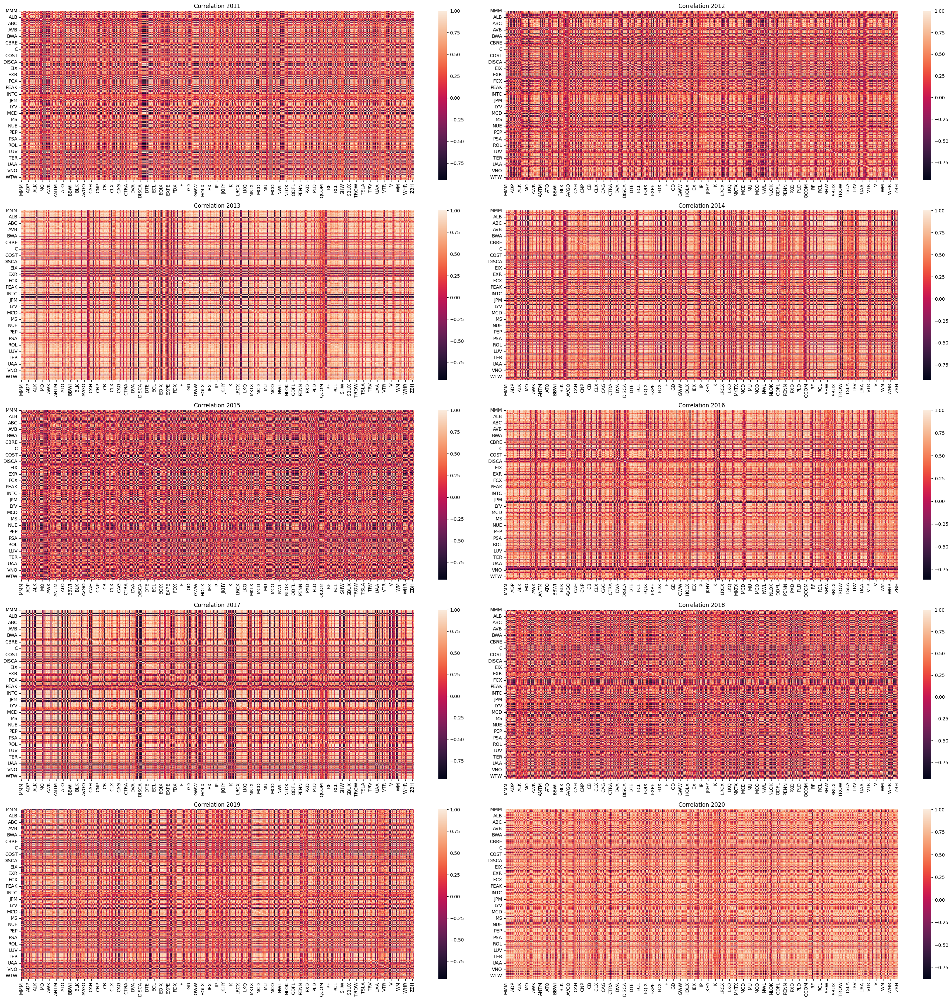

In [15]:
fig, axes = plt.subplots(5, 2, figsize=(30, 30))
years = list(range(2011, 2021))
for idx, year in enumerate(years):
    ax = axes[idx // 2, idx % 2]
    sns.heatmap(correlations[year], ax=ax)
    ax.set_title(f"Correlation {year}")
plt.tight_layout()
plt.show()

### **Analysis of Correlation Heatmaps and Major World Events (2011-2020)**

Reviewing the correlation heatmaps from 2011 to 2020, we observe how the relationships between stocks within the S&P 500 evolve across a turbulent decade. Several important global events likely influenced these inter-stock correlations:

- **2011**: The year was marked by the European sovereign debt crisis, U.S. credit rating downgrade, and tsunami in Japan. Market uncertainty often leads to higher correlations as investors react to broad macroeconomic influences, sometimes causing "risk-on/risk-off" behavior.
- **2012-2013**: The global economy was recovering but still facing headwinds related to Eurozone instability. Central banks began unconventional monetary policy (e.g., Fed’s quantitative easing), which often pushes asset correlations higher due to increased liquidity.
- **2014-2015**: Falling oil prices in 2014 and the beginning of China’s market and currency turmoil in 2015 created industry-specific movements. For example, energy sector stocks may correlate more strongly at times of oil price shocks, but could also decouple from other industries.
- **2016**: The year of the Brexit vote and the U.S. presidential election. Political surprises and shifting fiscal/monetary policies can increase correlations as investors digest new information.
- **2017**: Markets were relatively stable with strong global economic growth. During calmer periods, correlations between stocks often decrease, as individual company and sector movements (idiosyncratic risk) drive returns.
- **2018**: U.S.-China trade war and increasing interest rates from the U.S. Fed led to periodic spikes in volatility and correlations as markets responded to macro risks.
- **2019**: Trade tensions persisted but began easing by the end of the year. Asset correlations may show signs of normalization, but the possibility of geopolitical shocks still remains.
- **2020**: The COVID-19 pandemic caused an unprecedented spike in market stress and uncertainty. During the pandemic-induced crash, correlations sharply increased across sectors as investors reacted globally. The stimulus measures and subsequent recovery may also result in both periods of high and low correlations, depending on market confidence.

**In summary:** Periods of crisis or macroeconomic uncertainty (e.g., 2011, 2015, 2020) tend to produce higher average correlations between stocks, as investors move together. In contrast, during more stable periods (e.g., 2017), correlations decrease and stock movements are more influenced by individual fundamentals. The heatmaps above capture these dynamics: look for more intense (darker) colors in periods of crisis, and more diverse, patchy correlations in calmer years.

# **Creating graphs**

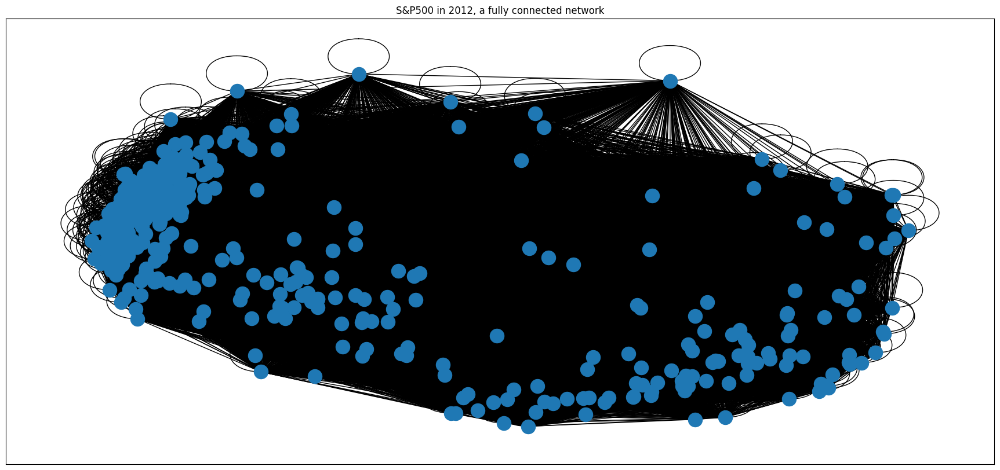

In [16]:
# Example of a graph
graph_2012 = nx.from_pandas_adjacency(correlations[2012])
plt.figure(figsize=(22,10))
nx.draw_networkx(graph_2012, with_labels=False)
plt.title('S&P500 in 2012, a fully connected network')
plt.show()

Every stock in the S&P500 is represented as one of the blue dots in the graph, the edges are all the black lines. The weight of the edges are the correlations values among each stock. This is what it is called as a **Fully connected graph** and that´s the reason why its hard to read and interpret. Since there are lots of stocks connected between each other and with inner loops, the graph is unreadable. 

To make the graph easier to read and to analyze in order to extract insights, the graph is filtered.

## **Filtering Graphs**

### **MST - Minimum Spanning Tree**

MST stands for Minimum Spanning Tree. In the context of network analysis and graph theory, an MST is a way to connect all the nodes (here, stocks) in a graph with the smallest possible total edge weight (here, based on correlation distances), without forming any cycles. Its a popular technique to eliminate redundancies and noise while maintaining the significant links in the network.

For finance, using an MST allows us to reveal the most important relationships in a complex correlation network—showing the "backbone" structure that links stocks together most tightly. This drastically reduces visual complexity, making it easier to interpret clusters, hubs, or sectoral linkages in the S&P 500.

In [17]:
# Creating the distance function
def distance(corr_data):
    distance = np.sqrt(2 * (1 - corr_data))
    return distance

This function computes the "distance" between two nodes in the network based on their correlation. A high correlation (close to 1) results in a small distance, while a low correlation yields a larger distance. Squaring the difference ensures that the distance remains non-negative, effectively mapping correlations to suitable distances for network analysis.

In [18]:
# Calculating the distances in all years
distances = {}
for i in range(2011,2021):
    distances[i] = distance(correlations[i])

In [19]:
# Creating a graph for each year
graphs = {}
for i in range(2011,2021):
    graphs[i] = nx.Graph(distances[i])
    
# Create the minimum spanning tree for each year
filtered_graphs = {}
for i in range(2011, 2021):
    filtered_graphs[i] = nx.minimum_spanning_tree(graphs[i])


Once the MST have been calculated for each year, we can plot the new graphs and see the the important relationships among the stocks

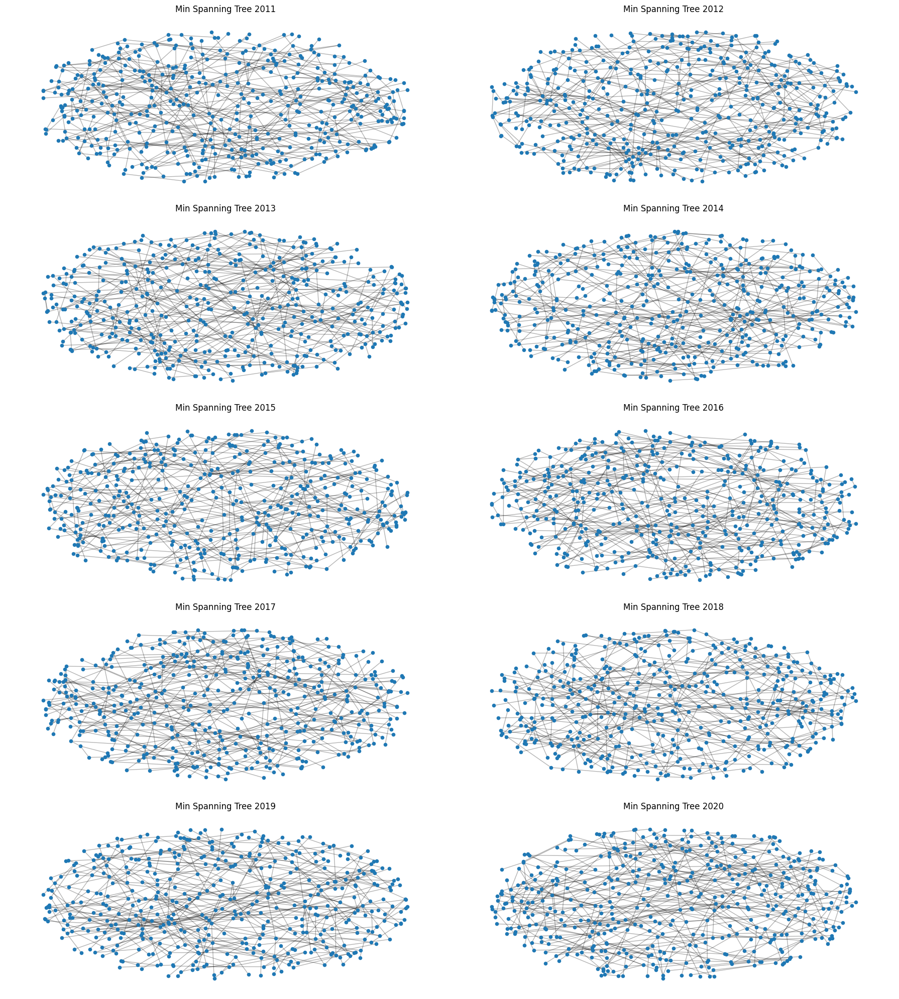

In [20]:
fig, axes = plt.subplots(5, 2, figsize=(18, 20))
years = list(range(2011, 2021))
for idx, year in enumerate(years):
    ax = axes[idx // 2, idx % 2]
    G = filtered_graphs[year]
    pos = nx.spring_layout(G, seed=42, k=0.2)
    nx.draw_networkx_nodes(G, pos, ax=ax, node_size=20)
    nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.3)
    ax.set_title(f"Min Spanning Tree {year}")
    ax.set_axis_off()
plt.tight_layout()
plt.show()

In the MST, there are the same amount of vertices (stocks) but doesn´t have so many edges that its impossible to read and understand. In this plot, the weak relationships between the nodes is not display as an edge, only the important relationships and high correlations among the nodes.

Something expected that is confirmed with these plots, is the fact that **no year has the same graph**, it is expected because every year is affected by different factors, policies, market behaviour, etc. And each plot is a unique representation of the S&P500 and how the market behaved during that specific year.

### **Computing Statistics Over Time**

1. **Average Shortest path length** 
You can calculate the shortest path between any two nodes. This metric allows you to understand how clustered or how spread the network is

In [21]:
### **Computing Statistics Over Time**
avg_shortest_path = {}
avg_degree_connectivity = {}
for i in range(2011, 2021):
    avg_shortest_path[i] = (nx.average_shortest_path_length(filtered_graphs[i]))

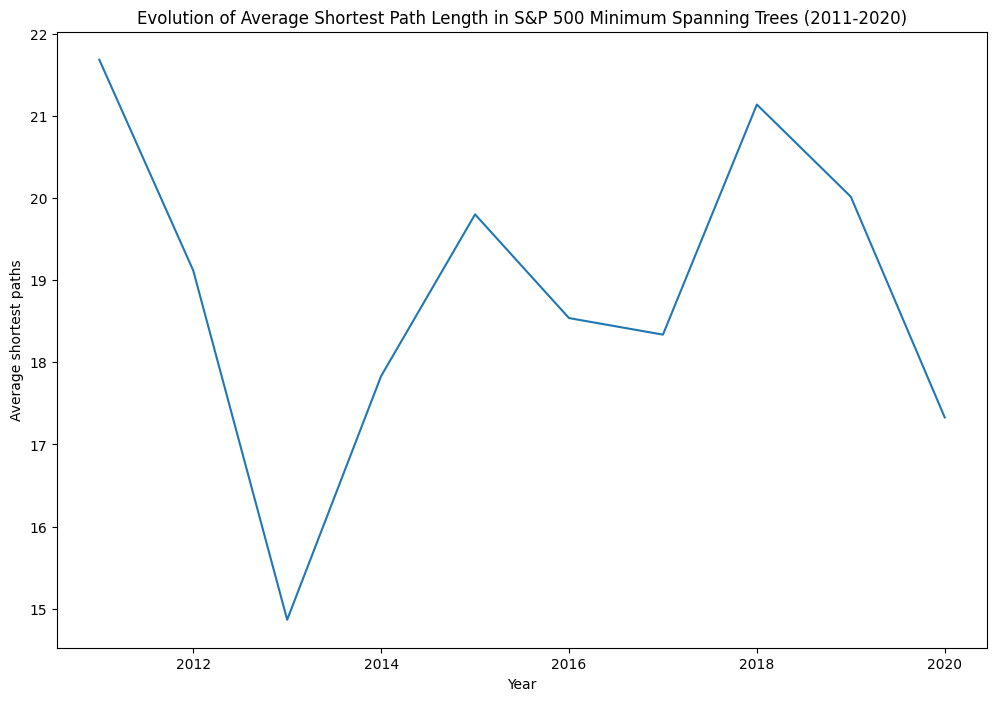

In [22]:
# Plotting the shortest paths
plt.figure(figsize = (12,8))
sns.lineplot(x = avg_shortest_path.keys(),
             y = avg_shortest_path.values())
plt.title('Evolution of Average Shortest Path Length in S&P 500 Minimum Spanning Trees (2011-2020)')
plt.ylabel('Average shortest paths')
plt.xlabel('Year')
plt.show()

The plot reveals a noticeable trend in the minimum spanning tree (MST) networks of the S&P 500: in 2011, the average shortest path length was at its maximum, indicating that the MST was more dispersed and that stocks were less tightly interconnected. In contrast, 2020 exhibited the lowest average shortest path length, meaning the market network became more clustered and stocks were more closely linked. This sharp increase in clustering during 2020 likely reflects the impact of the COVID-19 pandemic, which caused a high degree of market-wide synchronization—stocks across diverse sectors moved in a more correlated manner due to global uncertainty and systemic shocks. Such clustering is represented in the MST by shorter paths between stocks, as even companies in different industries were affected in similar ways. This pattern highlights how market crises can drive stronger collective behavior among assets, reducing the effective distance between nodes in the network.

# **Portfolio Construction**

In [23]:
# Calculate the returns among all the years
total_log_returns = np.log(df1.shift(1)) - np.log(df1)
total_correlations = total_log_returns.corr()

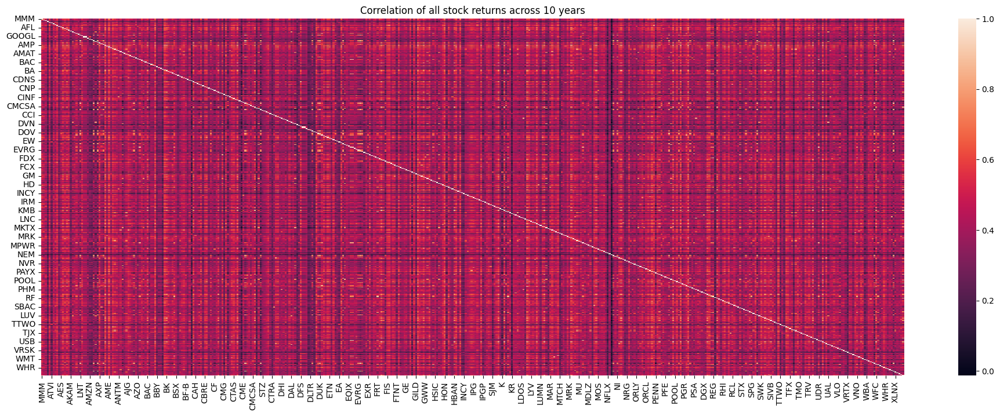

In [24]:
plt.figure(figsize =(24,8))
sns.heatmap(total_correlations)
plt.title('Correlation of all stock returns across 10 years');

In [25]:
# Calculate the same distance measurement as before

total_stocks_distance = np.sqrt(2 * total_correlations)
decade_graph = nx.Graph(total_stocks_distance)
# Remove edges with NaN weights before constructing MST
edges_to_remove = [(u, v) for u, v, d in decade_graph.edges(data=True) if np.isnan(d['weight'])]
decade_graph.remove_edges_from(edges_to_remove)
decade_graph_filtered = nx.minimum_spanning_tree(decade_graph);

/usr/local/lib/python3.12/dist-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: invalid value encountered in sqrt
  result = func(self.values, **kwargs)


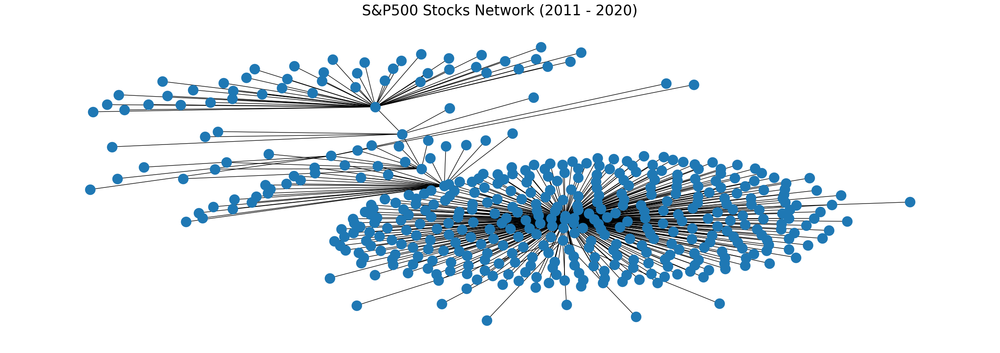

In [ ]:
plt.figure(figsize = (24,8))
nx.draw_kamada_kawai(decade_graph_filtered, with_labels = False)
plt.title('S&P500 Stocks Network (2011 - 2020)', fontsize = 25)
plt.show()

Observing this graph, we see that there are approximately three stocks (nodes) that serve as central hubs, connecting and clustering a large number of other stocks around them. These highly connected nodes likely represent influential companies whose movements have a significant impact on the structure of the entire market network.

Now that we have a graph of the S&P500, we can check the most important nodes with degree centrality.

In [27]:
# Centrality measurements
degree_centrality = nx.degree_centrality(decade_graph_filtered)
closeness_centrality = nx.closeness_centrality(decade_graph_filtered)
betweenness_centrality = nx.betweenness_centrality(decade_graph_filtered)
eigenvector_centrality = nx.eigenvector_centrality_numpy(decade_graph_filtered)

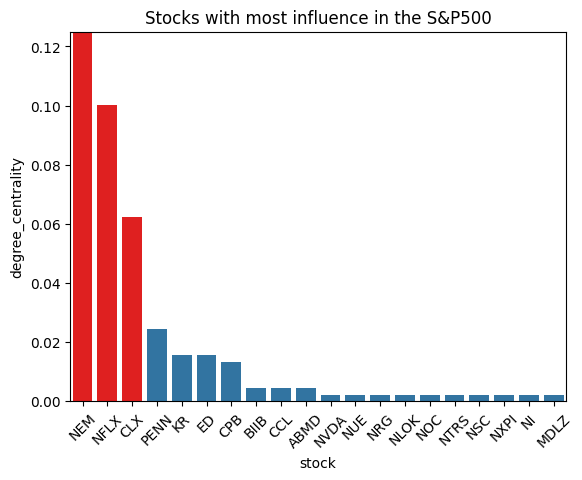

In [28]:
# Plotting the degree centrality
keys = []
values = []

for key, value in degree_centrality.items():
    keys.append(key)
    values.append(value)

dc_data = pd.DataFrame({'stock': keys, 'degree_centrality': values}).sort_values('degree_centrality', ascending = False)
plt.ylim(0,0.125)
# Limit to top 20 stocks
top_dc_data = dc_data.head(20)
sns.barplot(x=top_dc_data['stock'], y=top_dc_data['degree_centrality'])
sns.barplot(x=top_dc_data['stock'][0:3], color = 'r', y=top_dc_data['degree_centrality'])
plt.xticks(rotation=45)
plt.title('Stocks with most influence in the S&P500')
plt.show()

This plot of degree centrality confirms that there are 3 companies that have the most influence in the S&P500, these being:
- **NEM: Newmont Mining Corporation**

Newmont Corporation is the world's largest gold mining company, focused on the exploration, acquisition, development, and production of gold, copper, silver, zinc, and lead
- **NFLX: Netflix**

Based on the provided search results, there is no entity known as "Netflix Mining Corporation." Netflix, Inc. is a leading media and entertainment streaming company. It utilizes advanced data mining techniques to analyze user behavior, preferences, and viewing habits to recommend content and produce original programming
- **CLX: The Clorox Company**

The Clorox Company is a leading multinational manufacturer and marketer of consumer and professional products—primarily cleaning supplies, bleach, and household goods—and does not operate as a mining corporation. Its core business includes brands like Clorox, Pine-Sol, Liquid-Plumr, Brita, and Burt's Bees


This could mean that these companies are highly integrated into the market during that time period. The fact that they have a high degree of centrality means that they are highly correlated with lots of companies, meaning that these companies are good options to buy since they can benefit from almost any other stock in the index due to the fact that they influence multiple industries at a time. For example, **NEM** and their exploration in gold, silver, zinc, etc. Are critical industrial inputs that influence the electronics and technology industry, renewable energy and green transition, automotive and transportation industry, finance and investment, and so on. When the industries that they influence go up in the market price, **NEM** also goes up.

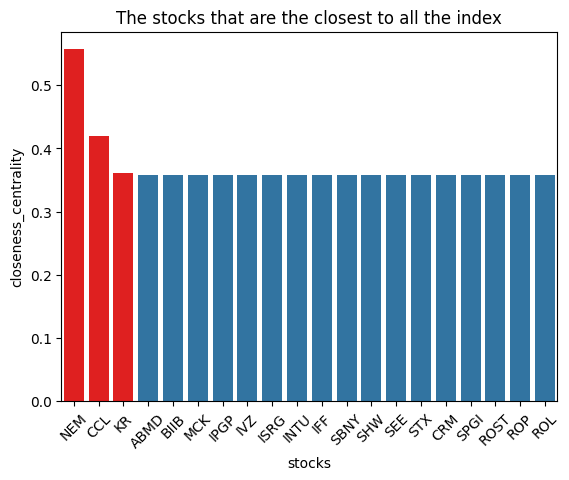

In [29]:
# Plotting closeness centrality
keys = []
values = []

for key, value in closeness_centrality.items():
    keys.append(key)
    values.append(value)

cc_data = pd.DataFrame({'stocks': keys, 'closeness_centrality': values}).sort_values('closeness_centrality', ascending=False)
# Top 20
top_20_cc = cc_data.head(20)
sns.barplot(data=top_20_cc, x='stocks', y='closeness_centrality')
sns.barplot(x = top_20_cc['stocks'][0:3], y = top_20_cc['closeness_centrality'], color = 'r')
plt.xticks(rotation = 45)
plt.title('The stocks that are the closest to all the index')
plt.show()

This plot highlights the stocks with the highest closeness centrality within the S&P 500, meaning these companies are, on average, the shortest distance from all other stocks in the network graph constructed from market data.
In the context of the S&P 500 and the broader market, stocks with high closeness centrality are well-positioned to rapidly reflect or propagate market-wide information, shocks, or movements because they are centrally located in the network of correlations.
Therefore, the companies at the top of this chart are not just well-connected, but may serve as key conduits for trends or changes that impact the entire market. 
Their prices may be sensitive barometers for systemic factors and could influence the dynamics of the S&P 500 index more broadly.

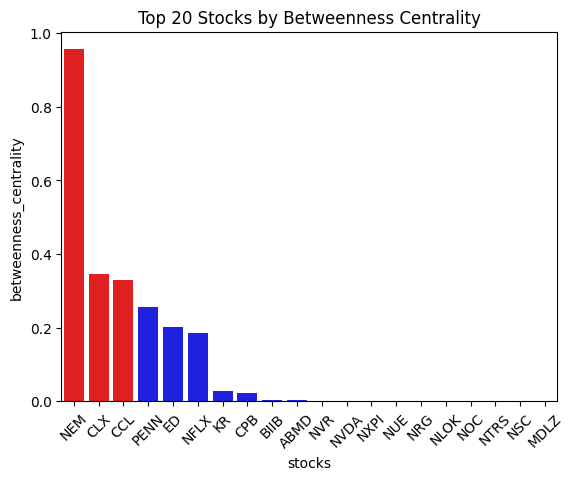

In [30]:
# Calculate and plot the top 20 stocks by betweenness centrality
keys = []
values = []

for key, value in betweenness_centrality.items():
    keys.append(key)
    values.append(value)

bc_data = pd.DataFrame({'stocks': keys, 'betweenness_centrality': values}).sort_values('betweenness_centrality', ascending=False)
# Top 20
top_20_bc = bc_data.head(20)

# Plot all bars in blue, then overlay the top 3 in red
sns.barplot(data=top_20_bc, x='stocks', y='betweenness_centrality', color='b')
sns.barplot(x=top_20_bc['stocks'][:3], y=top_20_bc['betweenness_centrality'][:3], color='r')
plt.xticks(rotation=45)
plt.title('Top 20 Stocks by Betweenness Centrality')
plt.show()

Betweenness centrality measures a node's influence by quantifying how often it acts as a bridge along the shortest paths between all other node pairs. High-scoring nodes act as central brokers or bottlenecks, controlling information flow and connecting disparate clusters. In this context, **NEM** acts again as the top stock and reaffirms the analysis above. It is a stock that is vital among different sectors or industries. The removal of this stock during this time period might result in a significal disruption in the market connectivity and the index itself.

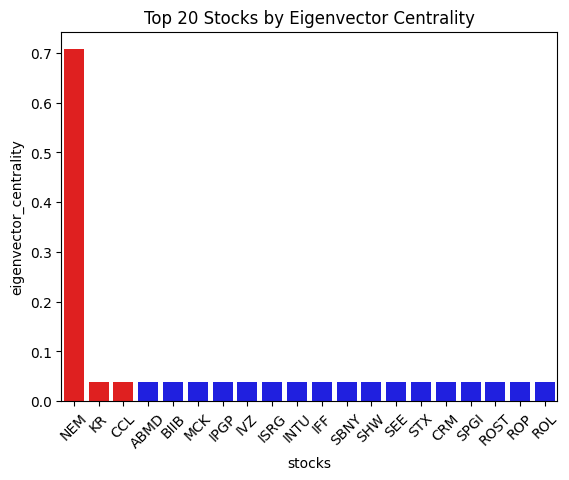

In [31]:
# Calculate and plot the top 20 stocks by eigenvector centrality
keys = []
values = []

for key, value in eigenvector_centrality.items():
    keys.append(key)
    values.append(value)

ec_data = pd.DataFrame({'stocks': keys, 'eigenvector_centrality': values}).sort_values('eigenvector_centrality', ascending=False)
# Top 20
top_20_ec = ec_data.head(20)

# Plot all bars in blue, then overlay the top 3 in red
sns.barplot(data=top_20_ec, x='stocks', y='eigenvector_centrality', color='b')
sns.barplot(x=top_20_ec['stocks'][:3], y=top_20_ec['eigenvector_centrality'][:3], color='r')
plt.xticks(rotation=45)
plt.title('Top 20 Stocks by Eigenvector Centrality')
plt.show()

 By far, the stock with the most Eigenvector Centrality is **NEM**. This shows that this stock is the one with most influence within the S&P500 and its behaviour influence all the index in general. This is due to the fact that during the 2011–2021 decade, Newmont Corporation (NEM) held a unique and critical position in the S&P 500 as the only gold producer included in the index. This exclusivity made it the primary vehicle for institutional investors and index funds to gain direct exposure to the gold mining industry within a diversified U.S. large-cap portfolio

# **Selecting Stocks based on Network Topological Parameters**

In [ ]:
# distance on degree criterion
distance_degree_criterion = {}
node_with_largest_degree_centrality = max(dict(degree_centrality), key=dict(degree_centrality).get)
for node in decade_graph_filtered.nodes():
    distance_degree_criterion[node] = nx.shortest_path_length(decade_graph_filtered, node, node_with_largest_degree_centrality)
    
# distance on correlation criterion. Node with the higest correlation
distance_correlation_criteria = {}
sum_correlation = {}

for node in decade_graph_filtered.nodes():
    neighbors = nx.neighbors(decade_graph_filtered, node)
    sum_correlation[node] = sum(total_correlations[node][neighbor] for neighbor in neighbors)

node_with_highest_correlation = max(sum_correlation, key=sum_correlation.get)
    
    
# distance on distance criterion
distance_distance_criteria = {}
mean_distance = {}

for node in decade_graph_filtered.nodes():
    nodes = list(decade_graph_filtered.nodes())
    nodes.remove(node)
    distance = [nx.shortest_path_length(decade_graph_filtered, node, n) for n in nodes]
    mean_distance[node] = np.mean(distance)

node_with_minimum_mean_distance = min(mean_distance, key=mean_distance.get)

    
for node in decade_graph_filtered.nodes():
    distance_distance_criteria[node] = nx.shortest_path_length(decade_graph_filtered, node, node_with_minimum_mean_distance)

Once we have the new metrix and criteria. Now, is time to compute statistics

In [38]:
node_stats = pd.DataFrame.from_dict(dict(degree_centrality), orient='index')
node_stats.columns = ['degree_centrality']
node_stats['betweenness_centrality'] = node_stats.index.map(betweenness_centrality.get)

node_stats['average_centrality'] = 0.5 * (node_stats['degree_centrality'] + node_stats['betweenness_centrality'])

# Use .map() to align values with DataFrame index (avoids misalignment from dict iteration order)
node_stats['distance_degree_criteria'] = node_stats.index.map(distance_degree_criterion.get)
node_stats['distance_correlation_criteria'] = node_stats.index.map(distance_correlation_criteria.get)
node_stats['distance_distance_criteria'] = node_stats.index.map(distance_distance_criteria.get)

node_stats['average_distance'] = (
    node_stats['distance_degree_criteria'] +
    node_stats['distance_correlation_criteria'] +
    node_stats['distance_distance_criteria']) / 3

In [39]:
# Displaying the node stats
display(node_stats.head())

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
MMM,0.002227,0.000000,0.001114,1,None,1,NaN
AOS,0.002227,0.000000,0.001114,1,None,1,NaN
ABT,0.002227,0.000000,0.001114,1,None,1,NaN
ABMD,0.004454,0.004454,0.004454,1,None,1,NaN
ACN,0.002227,0.000000,0.001114,1,None,1,NaN


## **Selecting the portfolios**
Nodes with the largest 10% of degree or betweenness centrality are chosen to be in the central portfolio. On the other hand, the nodes whose degree equals to 1 or betweenness centrality equals to 0 are chosen to be in the peripheral portfolio. The central and peripheral portfolios represent the two opposite sides of correlations and agglomeration. Generally, central stocks play a crucial role in the market and impose strong influence. The peripheral stocks are weak and contain mucho more noise than the central stocks, for that reason, its important to create the portfolio keeping in mind that informaiton.

In [ ]:
central_stocks = node_stats.sort_values('average_centrality', ascending = False).head(15)
central_portfolio = [stock for stock in central_stocks.index.values] # The stocks that are the most central

peripheral_stocks = node_stats.sort_values('average_distance', ascending = False).head(15)
peripheral_portfolio = [stock for stock in peripheral_stocks.index.values] # The stocks that are the farthests

In [43]:
display(central_stocks)

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
NEM,0.775056,0.956312,0.865684,0,None,0,NaN
CLX,0.062361,0.346852,0.204606,2,None,2,NaN
CCL,0.004454,0.329184,0.166819,1,None,1,NaN
NFLX,0.100223,0.186585,0.143404,5,None,5,NaN
PENN,0.024499,0.256025,0.140262,3,None,3,NaN
ED,0.015590,0.200694,0.108142,4,None,4,NaN
KR,0.015590,0.026577,0.021084,1,None,1,NaN
CPB,0.013363,0.022172,0.017768,4,None,4,NaN
ABMD,0.004454,0.004454,0.004454,1,None,1,NaN
BIIB,0.004454,0.004454,0.004454,1,None,1,NaN


In [42]:
display(peripheral_stocks)

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
MMM,0.002227,0.000000,0.001114,1,None,1,NaN
AOS,0.002227,0.000000,0.001114,1,None,1,NaN
ABT,0.002227,0.000000,0.001114,1,None,1,NaN
ABMD,0.004454,0.004454,0.004454,1,None,1,NaN
ACN,0.002227,0.000000,0.001114,1,None,1,NaN
ATVI,0.002227,0.000000,0.001114,1,None,1,NaN
ADM,0.002227,0.000000,0.001114,1,None,1,NaN
ADBE,0.002227,0.000000,0.001114,1,None,1,NaN
ADP,0.002227,0.000000,0.001114,1,None,1,NaN
AAP,0.002227,0.000000,0.001114,1,None,1,NaN


Text(0.5, 1.0, 'The central and peripheral Stocks in the S&P500')

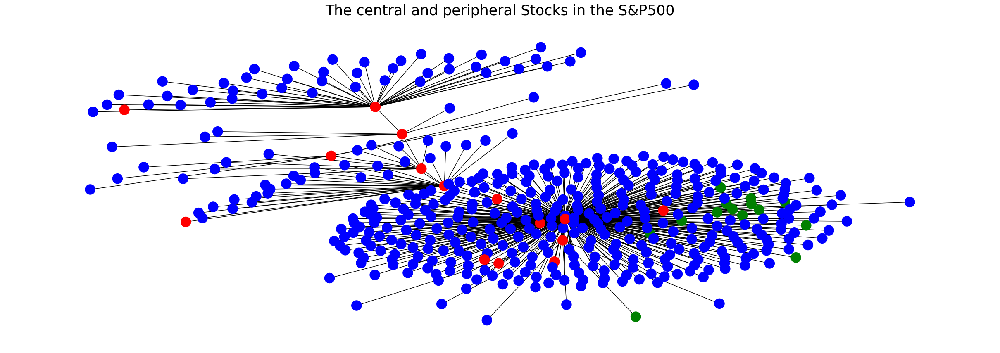

In [46]:
# Plotting the central and peripheral stocks

color = []
for node in decade_graph:
    if node in central_portfolio:
        color.append('red')
    elif node in peripheral_portfolio:
        color.append('green')
    else:
        color.append('blue')

plt.figure(figsize = (24,8))
nx.draw_kamada_kawai(decade_graph_filtered, with_labels = False, node_color = color)
plt.title('The central and peripheral Stocks in the S&P500', fontsize = 25)


# **Performance Evaluation**

If the investor wanted to buy the central stocks or the peripheral stocks, the performance needs to be addressed by comparing the performance of the central, peripheral portfolio against the S&P500. This helps to determine which portfolio performs the best. Its important to measure the performance using data after the one used in the analysis

In [48]:
display(df1.head()) # S&P500 for 2021

,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2010-12-31,63.855606,8.113162,17.986767,9.61,39.143620,11.245819,22.385578,30.780001,31.271172,63.355297,...,66.695137,11.205445,91.735100,73.964523,16.221039,23.216919,28.547478,37.990002,49.212429,21.089169
2011-01-03,64.218163,8.125947,17.952976,9.80,39.224346,11.318138,22.623722,31.290001,31.791464,62.732765,...,67.926483,11.205445,93.139076,77.632828,16.227924,23.569420,28.570745,38.200001,50.395058,21.907326
2011-01-04,64.129395,8.100383,18.121916,9.80,38.966022,11.327178,22.608845,31.510000,31.676586,59.610516,...,66.950417,11.123855,91.576157,80.054619,16.296804,23.665552,28.134232,37.840000,49.725819,21.550467
2011-01-05,64.129395,8.285738,18.121916,10.03,38.974094,11.110217,22.713020,32.220001,32.183357,59.687115,...,67.400887,11.141987,92.847679,81.087433,16.200367,23.745670,28.268110,37.799999,49.762482,21.672325
2011-01-06,63.737186,8.289999,18.084377,10.05,39.119389,11.083097,23.583750,32.270000,32.433369,57.723724,...,65.966843,11.119320,93.112579,81.678650,16.186602,24.146229,28.465996,37.480000,48.222305,21.611391


In [49]:
# Cleaning the data
df2 = df2.dropna(axis = 1)

In [75]:
# Analysis of performance

amount = 100000 #example for the first amount spent in each porfolio

# Central portfolio returns
central_portfolio_value = pd.DataFrame()
for stock in central_portfolio:
    central_portfolio_value[stock] = df2[stock]  # df1 contains 2021 S&P500 data

portfolio_unit = central_portfolio_value.sum(axis=1)[0]
share = amount / portfolio_unit
central_portfolio_value = central_portfolio_value.sum(axis=1) * share

# Peripheral portfolio returns
peripheral_portfolio_value = pd.DataFrame()
for stock in peripheral_portfolio:
    peripheral_portfolio_value[stock] = df2[stock]

portfolio_unit = peripheral_portfolio_value.sum(axis=1)[0]
share = amount / portfolio_unit
peripheral_portfolio_value = peripheral_portfolio_value.sum(axis=1) * share

# For visual consistency with the provided code, final series are:
central_portfolio_revenue = central_portfolio_value
peripheral_portfolio_revenue = peripheral_portfolio_value

/tmp/ipython-input-281782207.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  portfolio_unit = central_portfolio_value.sum(axis=1)[0]
/tmp/ipython-input-281782207.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  portfolio_unit = peripheral_portfolio_value.sum(axis=1)[0]


In [76]:
# performance of the index
snp_500_2021_value = df2 * (amount / df2.iloc[0])

In [77]:
snp_500_2021_value

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,WTW,WYNN,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2020-12-31,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,...,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
2021-01-04,98329.439207,98358.250740,99652.941983,98376.113302,97695.866459,98181.522481,96822.834500,98928.774436,97044.709485,95891.039185,...,96686.920462,94744.305407,98485.095914,100465.534587,97936.940046,97476.060572,98386.807716,99396.453070,98825.967010,98845.904959
2021-01-05,98163.532406,98996.713916,100885.929565,99393.376829,99506.475619,98740.466130,97673.669742,100852.995152,97114.693910,95624.294487,...,95880.010928,97660.197335,97525.135258,101735.198830,97819.034908,97485.264128,99021.679448,101116.226937,100391.344330,99534.722067
2021-01-06,99656.747656,102407.865291,100675.874114,98534.769289,99201.102172,99820.051344,94776.521578,104939.484986,93239.622913,95289.442882,...,96686.920462,98245.144620,99685.029087,99612.045542,101945.177516,98019.541979,102729.430728,103997.666184,111671.267562,100996.965777
2021-01-07,97099.387091,103666.542329,101653.133989,99589.352105,99802.586482,100761.832054,96575.117330,104007.140367,95525.072962,95828.615208,...,97422.634866,97270.227970,97735.135475,105600.622277,106572.360212,97273.396557,106444.987484,103381.142537,115078.271533,100906.339277
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,104301.615682,157144.656400,131196.081957,131457.793994,110373.218106,160967.660114,70831.340375,134237.272424,115508.277677,142433.806228,...,113470.669199,77621.200399,103043.891328,157141.843878,117318.768142,129258.840076,157762.870001,83483.110433,146871.432735,149769.352774
2021-12-28,104856.475756,158703.115191,130277.907722,131438.222100,110252.926892,160944.406123,72151.650929,135984.572814,113844.675460,142306.584503,...,113309.288741,76628.554180,104277.585250,155371.374504,118538.664857,129230.743507,155418.527878,83744.388965,147104.530336,148396.277739
2021-12-29,105310.990137,159204.051419,130945.665638,132386.916143,111610.111880,161002.558888,72681.945008,136147.115990,113830.677355,143428.512986,...,113171.635165,75316.850109,104801.897520,153502.143302,118379.982489,129867.632430,156407.258377,83757.445417,147897.044395,150085.291978


In [78]:
print(len(central_portfolio_revenue))
print(len(peripheral_portfolio_revenue))
print(len(snp_500_2021_value))


253
253
253


In [103]:
# Create a single DataFrame "all_portfolios" with the three portfolio values
all_portfolios = pd.DataFrame({
    'S&P500': df2.sum(axis=1) * (amount / df2.sum(axis=1).iloc[0]),
    'central_portfolio': pd.Series(central_portfolio_revenue.values, index=df2.index),
    'peripheral_portfolio': pd.Series(peripheral_portfolio_revenue.values, index=df2.index)
    # Align all portfolio values to the shared index (df2.index, 253 equities market days)
}, index=df2.index)
# convert the index to dates
all_portfolios.index = pd.to_datetime(all_portfolios.index)
display(all_portfolios.head(15));

,S&P500,central_portfolio,peripheral_portfolio
Date,,,
2020-12-31,100000.000000,100000.000000,100000.000000
2021-01-04,98343.406758,98834.688534,97952.168619
2021-01-05,99018.430610,98663.268544,99067.522624
2021-01-06,100207.446501,97644.402832,99484.499213
2021-01-07,101645.702365,98975.467853,100141.807477
2021-01-08,102127.004507,97551.432910,100701.936775
2021-01-11,101691.171796,98602.336178,99871.243022
2021-01-12,101795.706508,98277.699012,99963.056112
2021-01-13,101592.785391,98613.970459,100015.294483


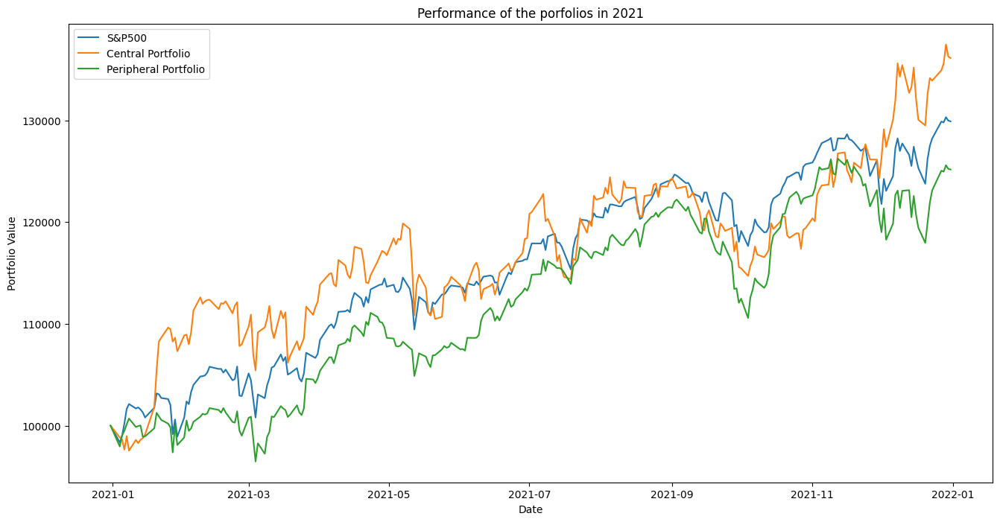

In [105]:
# Plotting the portolios performance

plt.figure(figsize=(16, 8))
plt.plot(all_portfolios['S&P500'], label='S&P500')
plt.plot(all_portfolios['central_portfolio'], label='Central Portfolio')
plt.plot(all_portfolios['peripheral_portfolio'], label='Peripheral Portfolio')
plt.legend(loc='upper left')
plt.title('Performance of the porfolios in 2021')
plt.xlabel('Date')
plt.ylabel('Portfolio Value')
plt.show()

In [102]:
# Calculate how much the central portfolio outperformed the S&P500 in 2021
central_return = (all_portfolios['central_portfolio'].iloc[-1] - all_portfolios['central_portfolio'].iloc[0]) / all_portfolios['central_portfolio'].iloc[0]
sp500_return = (all_portfolios['S&P500'].iloc[-1] - all_portfolios['S&P500'].iloc[0]) / all_portfolios['S&P500'].iloc[0]
outperformance = (central_return - sp500_return) * 100

print('the central_portfolio outperformed by:', outperformance)

the central_portfolio outperformed by: 6.225744970529224


This network analysis provided valuable insights into the relationships between S&P500 stocks from 2011 to 2021 and highlighted the significance of each stock within the market. In particular, we identified the central stocks, which have a strong influence on overall market behavior and tend to exhibit superior performance within the index. By constructing a Central Portfolio based on these key stocks, we achieved a 6.26% outperformance relative to the S&P500.

Generally, in stable market conditions central portfolio will perform better, whilst peripheral portfolio will perform better in crisis market conditions. This is due to peripheral stocks are kind of having a weak correlation, furthermore they won´t be impacted by all other sotcks the same way. 

Through this comprehensive network analysis of the S&P500 from 2011 to 2021, we explored the market through the lens of network science, identifying the interdependencies and centrality of stocks within the index. Leveraging centrality metrics, we pinpointed the most influential (central) and least connected (peripheral) stocks, enabling the creation of distinct portfolios to compare their performance to the benchmark S&P500.

Our findings showcased that the central portfolio—comprised of stocks with higher network centrality—was able to outperform the benchmark in a stable market environment, demonstrating the advantage of investing in stocks that play a crucial role in the market's structural core. On the other hand, peripheral stocks, which are less integrated in the broader market network, may serve as a potential hedge or source of resilience during periods of market stress, as they tend to react differently to market-wide shocks.

This analysis confirms that examining financial markets as evolving networks provides valuable tools for portfolio construction, risk management, and deeper insights into systemic behavior. By combining traditional financial metrics with network-based measures, investors and analysts can achieve a more nuanced view of market dynamics, enhancing both return potential and resilience to systemic risks.